# AR-ocean diagnostics
1. Read in AR track file
2. identify timing
3. plot atmospehre TMQ and surface windstress
4. examine ocean signature

In [ ]:
%reset

In [1]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import pop_tools 
from geocat.viz import util as gvutil
import datetime
import cf_units as cf
import cmocean


In [2]:
def change_units(ds, variable_str, variable_bounds_str, target_unit_str):
    orig_units = cf.Unit(ds[variable_str].attrs['units'])
    target_units = cf.Unit(target_unit_str)
    variable_in_new_units = xr.apply_ufunc(
        orig_units.convert, ds[variable_bounds_str], target_units,
        output_dtypes=[ds[variable_bounds_str].dtype])
    return variable_in_new_units


In [249]:
# method: 0 for difference 1 for mean
# note that xarray.copy, if you are copying the variable's data to the new data, the origial array will be affected
# i.e.. b=a.copy(data=a.data), then b=a[2]-a[1], will change a[2] value

def get_anoms(variable, index, istart, iend, bdays,adays, method):
    ncases = iend - istart
    anoms = variable[istart:iend+1, :,:].copy(data=np.array(variable[istart:iend+1,:,:].data))

    j = 0
    for i in np.arange(istart, iend):
        hit_day = index[i]
        before = index[i] - pd.to_timedelta(bdays,'D')     # 3 days before and maximum 7 days after
        after = index[i] + pd.to_timedelta(adays,'D')
        if method == 0:
            anoms[j,:,:] = np.array(variable.sel(time=after) - variable.sel(time=before))
        if method == 1:
            ar_range = variable.sel(time=slice(before,after))
            anoms[j,:,:] = ar_range.mean('time')

        anoms[j,:,:] = anoms[j].where(np.isfinite(anoms[j]),-99999)
        anoms[j,:,:]['time'] = index[i]
        print(index[i])
        j = j + 1                                 
    
    return anoms

## Read in Data

### 1. open AR storm event file

In [4]:
events_dir = "/glade/scratch/shields/iHESP/ar_outfiles/"
casename = "AR_lats_WEST_US_B.E.13.B1950TRC5.ne120_t12.cesm-ihesp-1950-2050.013_1950-1950_tmq_Zanom_ZN_8_2.nc"
ds = xr.open_dataset(events_dir+casename, decode_cf=False)
tmq = ds.TMQ
u850 = ds.U850
v850 = ds.V850
date6hr = ds.date
nstormdays=tmq.time.size


In [5]:
#convert date from event file, 6hourly snapshots
date6h = np.arange('2007-01-01', nstormdays, dtype='datetime64')
for i in range(nstormdays):
    date_str = str(date6hr[i].values)
    date_str
    yyy = int(date_str[0:4])   
    mmm = int(date_str[4:6])
    ddd = int(date_str[6:8])  
    date6h[i] = datetime.datetime(yyy,mmm,ddd)    # convert string to datetime object
    del(yyy)
    del(mmm)
    del(ddd)


In [6]:
import pandas as pd
ar_date6hr = pd.to_datetime(date6h)

In [7]:
u850['time'] = ar_date6hr
v850['time'] = ar_date6hr
tmq['time'] = ar_date6hr

## now get surface heat flux

In [225]:
ocn_dir = "/glade/scratch/huili7/AR_cases/data/"
shf_file = "B.E.13.B1950TRC5.ne120_t12.cesm-ihesp-1950-2050.013.pop.h.nday1.SHF.19500102-19501231.1x1.nc"
dsh = xr.open_dataset(ocn_dir+shf_file)

shf0 = dsh.SHF
shf_new = shf0.roll(lon=180)             #lonflip 
shf_new['lon'] = np.arange(-180,180,1)
del(shf0)
shf = shf_new.sel(lat=slice(15,55),lon=slice(-160,-110))
del(shf_new)

/glade/work/huili7/miniconda3/envs/geocat_env/lib/python3.7/site-packages/xarray/core/dataarray.py:2823: FutureWarning: roll_coords will be set to False in the future. Explicitly set roll_coords to silence warning.
  shifts=shifts, roll_coords=roll_coords, **shifts_kwargs


In [9]:
shf['time'] = shf.indexes['time'].to_datetimeindex()

/glade/work/huili7/miniconda3/envs/geocat_env/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  """Entry point for launching an IPython kernel.


## now get SSH

<h1 style="red' now find timing AR \>
### 1. 
           from AR case  -- ar_date

The original date from the netcdf files are just integers. We will need to convert them to datetime class for easy manipulation and indexing

We use the datetim.datetime()

In [241]:
ssh_file = "B.E.13.B1950TRC5.ne120_t12.cesm-ihesp-1950-2050.013.pop.h.nday1.SSH.19500102-19501231.1x1.nc"
dshh = xr.open_dataset(ocn_dir+ssh_file)
ssh0 = dshh.SSH
ssh_new = ssh0.roll(lon=180)             #lonflip 
ssh_new['lon'] = np.arange(-180,180,1)
#del(ssh0)
ssh = ssh_new.sel(lat=slice(15,55),lon=slice(-160,-110))
del(ssh_new)
ssh['time'] = ssh.indexes['time'].to_datetimeindex()

/glade/work/huili7/miniconda3/envs/geocat_env/lib/python3.7/site-packages/xarray/core/dataarray.py:2823: FutureWarning: roll_coords will be set to False in the future. Explicitly set roll_coords to silence warning.
  shifts=shifts, roll_coords=roll_coords, **shifts_kwargs
/glade/work/huili7/miniconda3/envs/geocat_env/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  if __name__ == '__main__':


## now get SST

In [276]:
sst_file = "B.E.13.B1950TRC5.ne120_t12.cesm-ihesp-1950-2050.013.pop.h.nday1.SST.19500102-19501231.1x1.nc"
dst= xr.open_dataset(ocn_dir+sst_file)

sst0 = dst.SST
sst_new = sst0.roll(lon=180)             #lonflip 
sst_new['lon'] = np.arange(-180,180,1)
#del(sst0)
sst = sst_new.sel(lat=slice(15,55),lon=slice(-160,-110))
del(sst_new)

/glade/work/huili7/miniconda3/envs/geocat_env/lib/python3.7/site-packages/xarray/core/dataarray.py:2823: FutureWarning: roll_coords will be set to False in the future. Explicitly set roll_coords to silence warning.
  shifts=shifts, roll_coords=roll_coords, **shifts_kwargs


In [277]:
sst['time'] = sst.indexes['time'].to_datetimeindex()

/glade/work/huili7/miniconda3/envs/geocat_env/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  """Entry point for launching an IPython kernel.


## now get taux and tauy

In [15]:
taux_file = "B.E.13.B1950TRC5.ne120_t12.cesm-ihesp-1950-2050.013.pop.h.nday1.TAUX.19500102-19501231.1x1.nc"
dstx= xr.open_dataset(ocn_dir+taux_file)

taux0 = dstx.TAUX
taux_new = taux0.roll(lon=180)             #lonflip 
taux_new['lon'] = np.arange(-180,180,1)
del(taux0)
taux = taux_new.sel(lat=slice(15,55),lon=slice(-160,-110))
del(taux_new)
taux['time'] = taux.indexes['time'].to_datetimeindex()

/glade/work/huili7/miniconda3/envs/geocat_env/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  # Remove the CWD from sys.path while we load stuff.


In [16]:
tauy_file = "B.E.13.B1950TRC5.ne120_t12.cesm-ihesp-1950-2050.013.pop.h.nday1.TAUY.19500102-19501231.1x1.nc"
dsty= xr.open_dataset(ocn_dir+tauy_file)

tauy0 = dsty.TAUY
tauy_new = tauy0.roll(lon=180)             #lonflip 
tauy_new['lon'] = np.arange(-180,180,1)
del(tauy0)
tauy = tauy_new.sel(lat=slice(15,55),lon=slice(-160,-110))
del(tauy_new)
tauy['time'] = tauy.indexes['time'].to_datetimeindex()

/glade/work/huili7/miniconda3/envs/geocat_env/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  # Remove the CWD from sys.path while we load stuff.


## read in HMXL

In [279]:
hmxl_file = "B.E.13.B1950TRC5.ne120_t12.cesm-ihesp-1950-2050.013.pop.h.nday1.HMXL.19500102-19501231.1x1.nc"
dsthm= xr.open_dataset(ocn_dir+hmxl_file)

hmxl0= change_units(dsthm, "HMXL", "HMXL", "m")

hmxl_new = hmxl0.roll(lon=180)             #lonflip 
hmxl_new['lon'] = np.arange(-180,180,1)
del(hmxl0)
hmxl = hmxl_new.sel(lat=slice(15,55),lon=slice(-160,-110))
del(hmxl_new)
hmxl['time'] = hmxl.indexes['time'].to_datetimeindex()

/glade/work/huili7/miniconda3/envs/geocat_env/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  # This is added back by InteractiveShellApp.init_path()


<h3 style='color:blue'>  Now get daily mean for tmq, uv850 <\h3>

In [18]:
tmq_daily = tmq.resample(time='D').mean()

In [19]:
u850_daily = u850.resample(time='D').mean()
v850_daily = v850.resample(time='D').mean()

In [21]:
#tmq_daily = tmq_daily.where(np.isfinite, drop=True)
#u850_daily = u850_daily.where(np.isfinite, drop=True)
#v850_daily = v850_daily.where(np.isfinite, drop=True)

 <p style='color:blue'> For ocean, We need to convert between cftime (from ocean model output) to datetime (the one we just created for AR cases) </p1>
we also need to be careful as the ocean time attribute unit is different from the atmosphere

In [280]:
ocn_datetime = hmxl['time']
hmxl['time']= ocn_datetime - pd.to_timedelta(1,'D')
shf['time']= ocn_datetime - pd.to_timedelta(1,'D')
sst['time']= ocn_datetime - pd.to_timedelta(1,'D')
taux['time']= ocn_datetime - pd.to_timedelta(1,'D')
tauy['time']= ocn_datetime - pd.to_timedelta(1,'D')

In [281]:
ssh['time'] = ssh['time'] - pd.to_timedelta(1,'D')

### Create ocean mask for atm

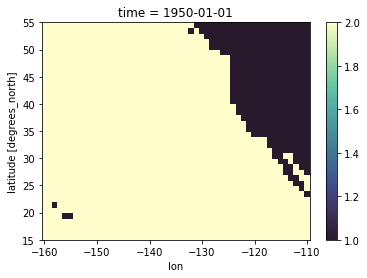

In [24]:
mask_ocean = 2 * np.ones((hmxl.shape[1], hmxl.shape[2])) * np.isfinite(hmxl.isel(time=0))  
mask_land = 1 * np.ones((hmxl.shape[1], hmxl.shape[2])) * np.isnan(hmxl.isel(time=0))  
mask_array = mask_ocean + mask_land
mask_array.plot(cmap=cmocean.cm.deep_r)

### divide region for composites

In [25]:
pnw = tmq_daily.time
pnw.time

<xarray.DataArray 'time' (time: 361)>
array(['1950-01-05T00:00:00.000000000', '1950-01-06T00:00:00.000000000',
       '1950-01-07T00:00:00.000000000', ..., '1950-12-29T00:00:00.000000000',
       '1950-12-30T00:00:00.000000000', '1950-12-31T00:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 1950-01-05 1950-01-06 ... 1950-12-31

## get anomalies and plot

In [284]:
#195 - 217 for pnw
start = 5
end = 20
ncases = end - start 

hmxl_anoms = get_anoms(hmxl,pnw.time, start, end, 3, 3, 0)
ssh_anoms = get_anoms(ssh, pnw.time,start, end, 3, 3, 0)
shf_anoms = get_anoms(shf, pnw.time,start, end, 1, 1, 1)
sst_anoms = get_anoms(sst,pnw.time,start,end,3,3,0)
    

<xarray.DataArray 'time' ()>
array('1950-01-10T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 1950-01-10
<xarray.DataArray 'time' ()>
array('1950-01-11T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 1950-01-11
<xarray.DataArray 'time' ()>
array('1950-01-12T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 1950-01-12
<xarray.DataArray 'time' ()>
array('1950-01-13T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 1950-01-13
<xarray.DataArray 'time' ()>
array('1950-01-14T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 1950-01-14
<xarray.DataArray 'time' ()>
array('1950-01-15T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 1950-01-15
<xarray.DataArray 'time' ()>
array('1950-01-16T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 195

/glade/work/huili7/miniconda3/envs/geocat_env/lib/python3.7/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/glade/work/huili7/miniconda3/envs/geocat_env/lib/python3.7/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/glade/work/huili7/miniconda3/envs/geocat_env/lib/python3.7/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/glade/work/huili7/miniconda3/envs/geocat_env/lib/python3.7/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/glade/work/huili7/miniconda3/envs/geocat_env/lib/python3.7/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


#### plot all cases

 doing composite. Even NWP has differnt types of ARs...

In [75]:
tmq_sub = tmq_daily.sel(lat=slice(15,55),lon=slice(-160,-110))
u850_sub = u850_daily.sel(lat=slice(15,55),lon=slice(-160,-110))
v850_sub = v850_daily.sel(lat=slice(15,55),lon=slice(-160,-110))

<xarray.DataArray 'time' ()>
array('1950-01-05T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 1950-01-05
<xarray.DataArray 'time' ()>
array('1950-01-06T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 1950-01-06
<xarray.DataArray 'time' ()>
array('1950-01-07T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 1950-01-07
<xarray.DataArray 'time' ()>
array('1950-01-08T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 1950-01-08
<xarray.DataArray 'time' ()>
array('1950-01-09T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 1950-01-09
<xarray.DataArray 'time' ()>
array('1950-01-10T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 1950-01-10
<xarray.DataArray 'time' ()>
array('1950-01-11T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 195

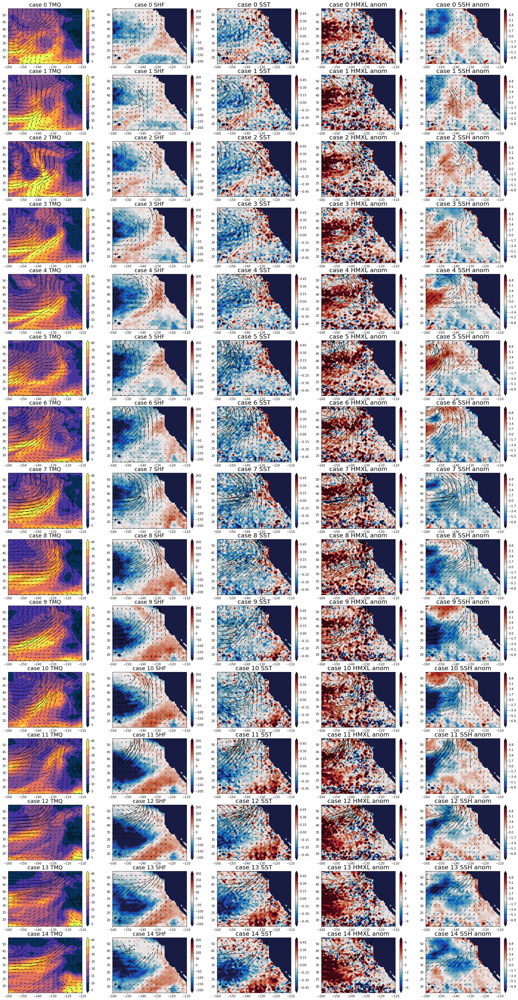

In [286]:
nrows = ncases
ncols =5
start = 0   #from case number 5

levels = np.arange(5,45.,5)
levels1=np.arange(10,800,50)
levels2 = np.arange(-10,11,1)

lats= tmq_sub.lat
lons= tmq_sub.lon
lats2 =hmxl_anoms.lat
lons2 = hmxl_anoms.lon
color_map=cmocean.cm.thermal

veclon = tmq_sub.lon[::10]                  #-- only every 2nd vector
veclat = tmq_sub.lat[::10]    

veclon2 = taux.lon[::3]
veclat2 = taux.lat[::3]


u850_space = u850_sub[:,::10,::10]
v850_space = v850_sub[:,::10,::10]


taux_space = taux[:,::3,::3]
tauy_space = tauy[:,::3,::3]


fig, axes = plt.subplots(nrows,ncols,figsize=(30,60))



color_map=cmocean.cm.thermal
 

image= []
j=0
image.append(0)

for i in np.arange(0,ncases,1):
    print(pnw.time[i+start])
    u850_mean = u850_space.sel(time=pnw.time[i+start])
    v850_mean = v850_space.sel(time=pnw.time[i+start])
    
    taux_mean = taux_space.sel(time=pnw.time[i+start])
    tauy_mean = tauy_space.sel(time=pnw.time[i+start])
    
    image[j] = axes[i,0].contourf(lons,lats,tmq_sub.sel(time=pnw.time[i+start]),levels=levels,extend='both',cmap=cmocean.cm.thermal) 
    axes[i,0].quiver(veclon, veclat, u850_mean, v850_mean,scale=160)
    axes[i,0].set_title('case '+str(i)+' TMQ',fontsize=18)
    fig.colorbar(image[j],ax=axes[i,0], fraction=.1)
    j = j + 1
    image.append(j)
    
    image[j] = axes[i,1].contourf(lons2,lats2,shf_anoms.isel(time=i),levels = np.arange(-200,210, 10),extend='both',cmap=cmocean.cm.balance) 
    axes[i,1].quiver(veclon2, veclat2, taux_mean, tauy_mean,scale=30)
    axes[i,1].set_title('case '+str(i)+' SHF',fontsize=18)
    fig.colorbar(image[j],ax=axes[i,1], fraction=.1)
    j = j+1
    image.append(j)
    
       

    
    
    image[j] = axes[i,2].contourf(lons2,lats2,sst_anoms.isel(time=i),levels = np.arange(-.5,.55, 0.05),extend='both',cmap=cmocean.cm.balance) 
    axes[i,2].quiver(veclon2, veclat2, taux_mean, tauy_mean,scale=20)
    axes[i,2].set_title('case '+str(i)+' SST',fontsize=20)
    fig.colorbar(image[j],ax=axes[i,2], fraction=.1)
    j = j+1
    image.append(j)
    
    
    image[j] = axes[i,3].contourf(lons2,lats2,hmxl_anoms.isel(time=i),levels = levels2,extend='both',cmap=cmocean.cm.balance) 
    axes[i,3].quiver(veclon2, veclat2, taux_mean, tauy_mean,scale=20)
    axes[i,3].set_title('case '+str(i)+' HMXL anom',fontsize=20)
    fig.colorbar(image[j],ax=axes[i,3], fraction=.1)
    j = j+1
    image.append(j)
    
    image[j] = axes[i,4].contourf(lons2,lats2,ssh_anoms.isel(time=i),levels =np.arange(-8., 8.1, 0.1),extend='both',cmap=cmocean.cm.balance) 
    axes[i,4].quiver(veclon2, veclat2, taux_mean, tauy_mean,scale=30)
    axes[i,4].set_title('case '+str(i)+' SSH anom',fontsize=20)
    fig.colorbar(image[j],ax=axes[i,4], fraction=.1)
    j = j+1
    image.append(j)
    
#cs0 = axes[5,0].contourf(lons,lats,tmq_mean,levels = levels,extend='both',cmap=cmocean.cm.thermal)    

#fig.colorbar(cs0,ax = axes[5,0], orientation='horizontal', fraction=.1)
#fig.colorbar(cs1, ax=ax[1])

plt.savefig('AR_cases_ihesp')

In [68]:
chosen=np.array([0,1,2,3,5,7,9,10, 11,18, 19, 20])
chosen = chosen + start
chosen

array([195, 196, 197, 198, 200, 202, 204, 205, 206, 213, 214, 215])

#### now try composite everything

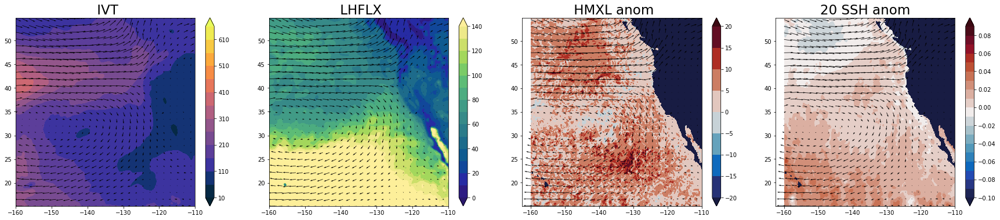

In [36]:
nrows = 1
ncols = 4
levels1=np.arange(10,700,50)


fig, axes = plt.subplots(nrows,ncols,figsize=(30,6))
 
ivt_pnw = ivt_daily.sel(time=pnw.nstorms[start:end]).mean('nstorms')
u850_pnw = u850_space.sel(time=pnw.nstorms[start:end]).mean('nstorms')
v850_pnw = v850_space.sel(time=pnw.nstorms[start:end]).mean('nstorms')
hmxl_pnw = hmxl_anoms.mean('time')
ssh_pnw = ssh_anoms.mean('time')
lhflx_pnw = lhflx_anoms.mean('time')
    
    
cs0c = axes[0].contourf(ivt_daily.lon,ivt_daily.lat,ivt_pnw, levels=levels1,extend='both',cmap=cmocean.cm.thermal) 
cs0q = axes[0].quiver(veclon, veclat, u850_pnw, v850_pnw,scale=200)
axes[0].set_title(' IVT',fontsize=23)
fig.colorbar(cs0c,ax=axes[0], fraction=.1)

cs1c = axes[1].contourf(lons, lats, lhflx_pnw, levels = np.arange(0,150, 10),extend='both',cmap=cmocean.cm.haline) 
cs1q = axes[1].quiver(veclon, veclat, u850_pnw, v850_pnw,scale=200)
axes[1].set_title(' LHFLX',fontsize=23)
fig.colorbar(cs1c,ax=axes[1], fraction=.1)


cs2c =  axes[2].contourf(lons2,lats2,hmxl_pnw, levels = levels2,extend='both',cmap=cmocean.cm.balance) 
cs2q =  axes[2].quiver(veclon, veclat, u850_pnw, v850_pnw,scale=200)
axes[2].set_title(' HMXL anom',fontsize=23)
fig.colorbar(cs2c,ax=axes[2], fraction=.1)
    
cs3c = axes[3].contourf(lons2,lats2,ssh_pnw,levels =np.arange(-0.1, 0.1, 0.01),extend='both',cmap=cmocean.cm.balance) 
cs3q = axes[3].quiver(veclon, veclat, u850_pnw, v850_pnw,scale=200)
axes[3].set_title(str(i)+' SSH anom',fontsize=23)
fig.colorbar(cs3c,ax=axes[3], fraction=.1)

plt.savefig('AR_comp_pnw')

### 2. Northern california

#### first,  plot everything

In [54]:
# nocal, 11-14 three cases
start = 11
end = 15
ncases = end - start 

hmxl_anoms = get_anoms(hmxl,nocal.nstorms, start, end, 3, 3, 0)
ssh_anoms = get_anoms(ssh, nocal.nstorms,start, end, 3, 3, 0)
lhflx_anoms = get_anoms(lhflx_sub, nocal.nstorms,start, end, 1, 1, 1)

    

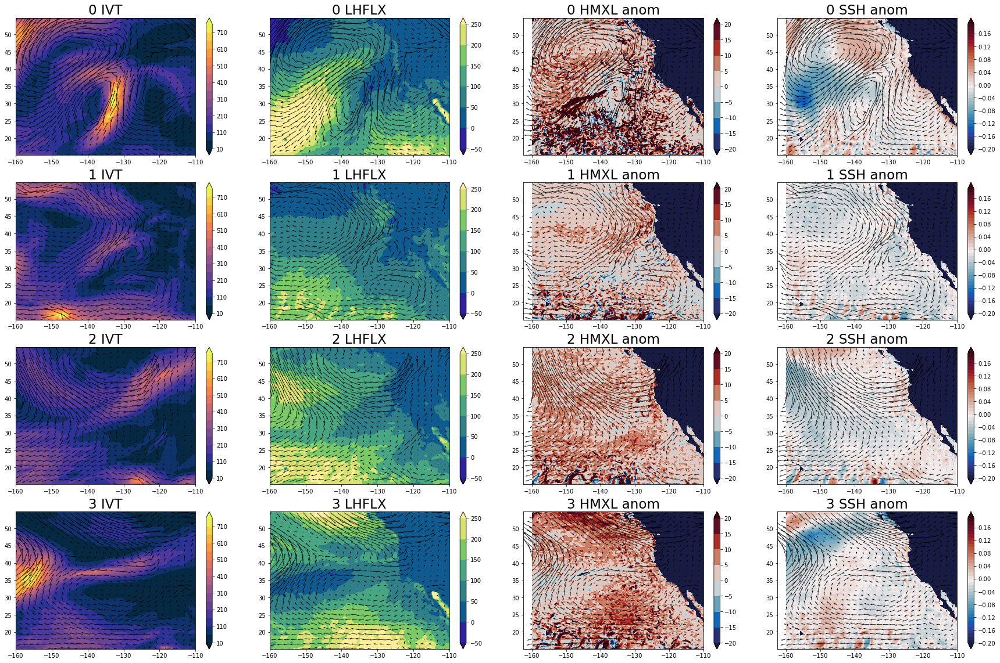

In [57]:
nrows =ncases
ncols =4

fig, axes = plt.subplots(nrows,ncols,figsize=(30,20))
levels = np.arange(5,45.,5)
levels1=np.arange(10,800,50)
levels2 = np.arange(-20,25,5)
color_map=cmocean.cm.thermal

veclon = tmq_daily.lon[::6]                  #-- only every 2nd vector
veclat = tmq_daily.lat[::6]    


image= []
j=0
image.append(0)

for i in np.arange(0,ncases,1):

    u850_mean = u850_space.sel(time=nocal.nstorms[i+start])
    v850_mean = v850_space.sel(time=nocal.nstorms[i+start])
    
    image[j] = axes[i,0].contourf(ivt_daily.lon,ivt_daily.lat,ivt_daily.sel(time=nocal.nstorms[i+start]),levels=levels1,extend='both',cmap=cmocean.cm.thermal) 
    axes[i,0].quiver(veclon, veclat, u850_mean, v850_mean,scale=200)
    axes[i,0].set_title(str(i)+' IVT',fontsize=23)
    fig.colorbar(image[j],ax=axes[i,0], fraction=.1)
    j = j + 1
    image.append(j)
    
    image[j] = axes[i,1].contourf(lons,lats,lhflx_anoms.isel(time=i),levels = np.arange(-50,300, 50),extend='both',cmap=cmocean.cm.haline) 
    axes[i,1].quiver(veclon, veclat, u850_mean, v850_mean,scale=200)
    axes[i,1].set_title(str(i)+' LHFLX',fontsize=23)
    fig.colorbar(image[j],ax=axes[i,1], fraction=.1)
    j = j+1
    image.append(j)
    
    
    image[j] = axes[i,2].contourf(lons2,lats2,hmxl_anoms.isel(time=i),levels = levels2,extend='both',cmap=cmocean.cm.balance) 
    axes[i,2].quiver(veclon, veclat, u850_mean, v850_mean,scale=200)
    axes[i,2].set_title(str(i)+' HMXL anom',fontsize=23)
    fig.colorbar(image[j],ax=axes[i,2], fraction=.1)
    j = j+1
    image.append(j)
    
    image[j] = axes[i,3].contourf(lons2,lats2,ssh_anoms.isel(time=i),levels =np.arange(-0.2, 0.2, 0.01),extend='both',cmap=cmocean.cm.balance) 
    axes[i,3].quiver(veclon, veclat, u850_mean, v850_mean,scale=200)
    axes[i,3].set_title(str(i)+' SSH anom',fontsize=23)
    fig.colorbar(image[j],ax=axes[i,3], fraction=.1)
    j = j+1
    image.append(j)
    
#cs0 = axes[5,0].contourf(lons,lats,tmq_mean,levels = levels,extend='both',cmap=cmocean.cm.thermal)    

#fig.colorbar(cs0,ax = axes[5,0], orientation='horizontal', fraction=.1)
#fig.colorbar(cs1, ax=ax[1])

#plt.savefig('AR_HMXL')

### now get composite

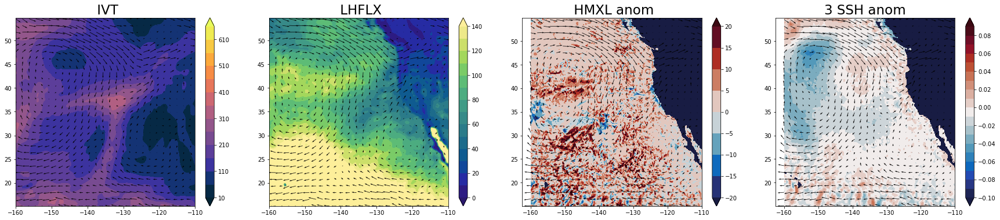

In [58]:
nrows = 1
ncols = 4
levels1=np.arange(10,700,50)


fig, axes = plt.subplots(nrows,ncols,figsize=(30,6))
 
ivt_nocal = ivt_daily.sel(time=nocal.nstorms[start:end]).mean('nstorms')
u850_nocal = u850_space.sel(time=nocal.nstorms[start:end]).mean('nstorms')
v850_nocal = v850_space.sel(time=nocal.nstorms[start:end]).mean('nstorms')
hmxl_nocal = hmxl_anoms.mean('time')
ssh_nocal = ssh_anoms.mean('time')
lhflx_nocal = lhflx_anoms.mean('time')
    
    
cs0c = axes[0].contourf(ivt_daily.lon,ivt_daily.lat,ivt_nocal, levels=levels1,extend='both',cmap=cmocean.cm.thermal) 
cs0q = axes[0].quiver(veclon, veclat, u850_nocal, v850_nocal,scale=200)
axes[0].set_title(' IVT',fontsize=23)
fig.colorbar(cs0c,ax=axes[0], fraction=.1)

cs1c = axes[1].contourf(lons, lats, lhflx_nocal, levels = np.arange(0,150, 10),extend='both',cmap=cmocean.cm.haline) 
cs1q = axes[1].quiver(veclon, veclat, u850_nocal, v850_nocal,scale=200)
axes[1].set_title(' LHFLX',fontsize=23)
fig.colorbar(cs1c,ax=axes[1], fraction=.1)


cs2c =  axes[2].contourf(lons2,lats2,hmxl_nocal, levels = levels2,extend='both',cmap=cmocean.cm.balance) 
cs2q =  axes[2].quiver(veclon, veclat, u850_nocal, v850_nocal,scale=200)
axes[2].set_title(' HMXL anom',fontsize=23)
fig.colorbar(cs2c,ax=axes[2], fraction=.1)
    
cs3c = axes[3].contourf(lons2,lats2,ssh_nocal,levels =np.arange(-0.1, 0.1, 0.01),extend='both',cmap=cmocean.cm.balance) 
cs3q = axes[3].quiver(veclon, veclat, u850_nocal, v850_nocal,scale=200)
axes[3].set_title(str(i)+' SSH anom',fontsize=23)
fig.colorbar(cs3c,ax=axes[3], fraction=.1)

plt.savefig('AR_comp_nocal')

### 3. southern california

all cases

In [93]:
# 38 - 45
start = 40
end = 45
ncases = end - start 

hmxl_anoms = get_anoms(hmxl,socal.nstorms, start, end, 3, 3, 0)
ssh_anoms = get_anoms(ssh, socal.nstorms,start, end, 3, 3, 0)
lhflx_anoms = get_anoms(lhflx_sub, socal.nstorms,start, end, 1, 1, 1)

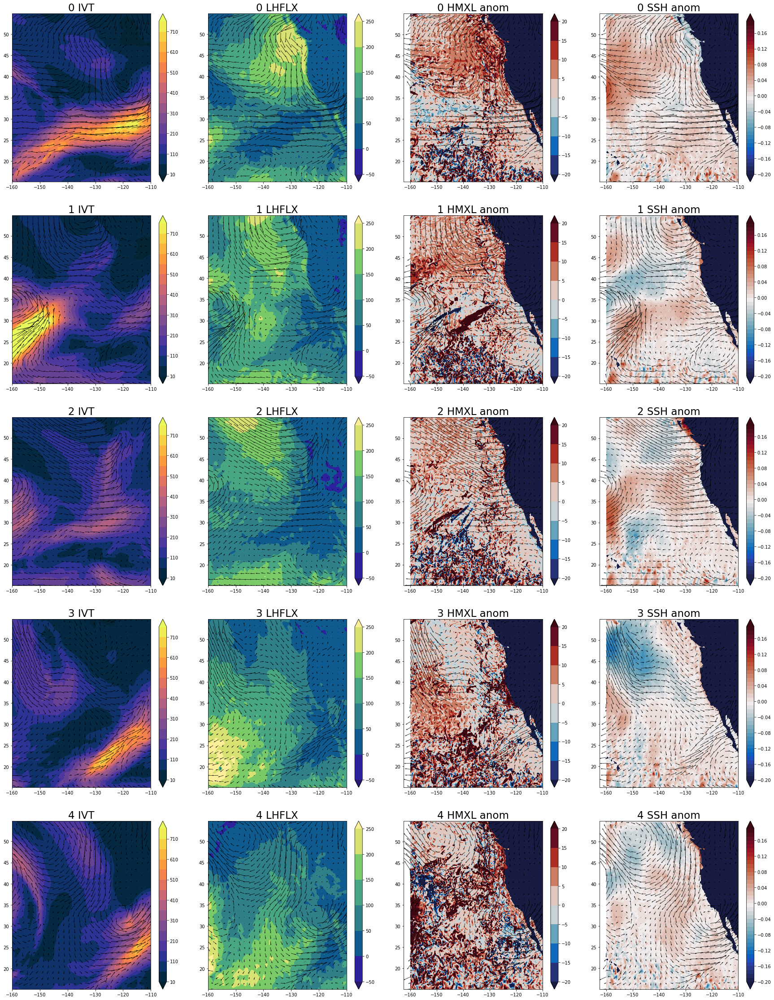

In [94]:
nrows =ncases
ncols =4

fig, axes = plt.subplots(nrows,ncols,figsize=(30,40))
levels = np.arange(5,45.,5)
levels1=np.arange(10,800,50)
levels2 = np.arange(-20,25,5)
color_map=cmocean.cm.thermal

veclon = tmq_daily.lon[::6]                  #-- only every 2nd vector
veclat = tmq_daily.lat[::6]    


image= []
j=0
image.append(0)

for i in np.arange(0,ncases,1):

    u850_mean = u850_space.sel(time=socal.nstorms[i+start])
    v850_mean = v850_space.sel(time=socal.nstorms[i+start])
    
    image[j] = axes[i,0].contourf(ivt_daily.lon,ivt_daily.lat,ivt_daily.sel(time=socal.nstorms[i+start]),levels=levels1,extend='both',cmap=cmocean.cm.thermal) 
    axes[i,0].quiver(veclon, veclat, u850_mean, v850_mean,scale=200)
    axes[i,0].set_title(str(i)+' IVT',fontsize=23)
    fig.colorbar(image[j],ax=axes[i,0], fraction=.1)
    j = j + 1
    image.append(j)
    
    image[j] = axes[i,1].contourf(lons,lats,lhflx_anoms.isel(time=i),levels = np.arange(-50,300, 50),extend='both',cmap=cmocean.cm.haline) 
    axes[i,1].quiver(veclon, veclat, u850_mean, v850_mean,scale=200)
    axes[i,1].set_title(str(i)+' LHFLX',fontsize=23)
    fig.colorbar(image[j],ax=axes[i,1], fraction=.1)
    j = j+1
    image.append(j)
    
    
    image[j] = axes[i,2].contourf(lons2,lats2,hmxl_anoms.isel(time=i),levels = levels2,extend='both',cmap=cmocean.cm.balance) 
    axes[i,2].quiver(veclon, veclat, u850_mean, v850_mean,scale=200)
    axes[i,2].set_title(str(i)+' HMXL anom',fontsize=23)
    fig.colorbar(image[j],ax=axes[i,2], fraction=.1)
    j = j+1
    image.append(j)
    
    image[j] = axes[i,3].contourf(lons2,lats2,ssh_anoms.isel(time=i),levels =np.arange(-0.2, 0.2, 0.01),extend='both',cmap=cmocean.cm.balance) 
    axes[i,3].quiver(veclon, veclat, u850_mean, v850_mean,scale=200)
    axes[i,3].set_title(str(i)+' SSH anom',fontsize=23)
    fig.colorbar(image[j],ax=axes[i,3], fraction=.1)
    j = j+1
    image.append(j)
    
#cs0 = axes[5,0].contourf(lons,lats,tmq_mean,levels = levels,extend='both',cmap=cmocean.cm.thermal)    

#fig.colorbar(cs0,ax = axes[5,0], orientation='horizontal', fraction=.1)
#fig.colorbar(cs1, ax=ax[1])

#plt.savefig('AR_HMXL')

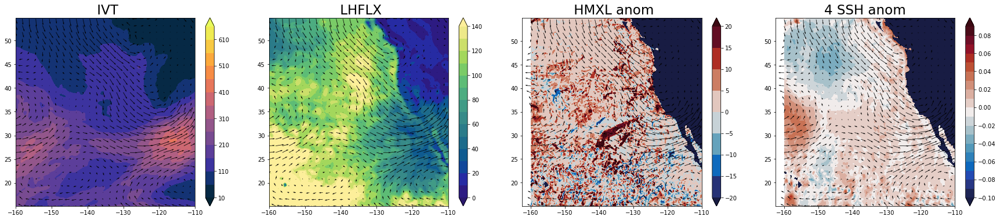

In [95]:
nrows = 3
ncols = 4
levels1=np.arange(10,700,50)


fig, axes = plt.subplots(nrows,ncols,figsize=(30,6))
 
ivt_socal = ivt_daily.sel(time=socal.nstorms[start:end]).mean('nstorms')
u850_socal = u850_space.sel(time=socal.nstorms[start:end]).mean('nstorms')
v850_socal = v850_space.sel(time=socal.nstorms[start:end]).mean('nstorms')
hmxl_socal = hmxl_anoms.mean('time')
ssh_socal = ssh_anoms.mean('time')
lhflx_socal = lhflx_anoms.mean('time')
    
    
cs0c = axes[0].contourf(ivt_daily.lon,ivt_daily.lat,ivt_socal, levels=levels1,extend='both',cmap=cmocean.cm.thermal) 
cs0q = axes[0].quiver(veclon, veclat, u850_socal, v850_socal,scale=200)
axes[0].set_title(' IVT',fontsize=23)
fig.colorbar(cs0c,ax=axes[0], fraction=.1)

cs1c = axes[1].contourf(lons, lats, lhflx_socal, levels = np.arange(0,150, 10),extend='both',cmap=cmocean.cm.haline) 
cs1q = axes[1].quiver(veclon, veclat, u850_socal, v850_socal,scale=200)
axes[1].set_title(' LHFLX',fontsize=23)
fig.colorbar(cs1c,ax=axes[1], fraction=.1)


cs2c =  axes[2].contourf(lons2,lats2,hmxl_socal, levels = levels2,extend='both',cmap=cmocean.cm.balance) 
cs2q =  axes[2].quiver(veclon, veclat, u850_socal, v850_socal,scale=200)
axes[2].set_title(' HMXL anom',fontsize=23)
fig.colorbar(cs2c,ax=axes[2], fraction=.1)
    
cs3c = axes[3].contourf(lons2,lats2,ssh_socal,levels =np.arange(-0.1, 0.1, 0.01),extend='both',cmap=cmocean.cm.balance) 
cs3q = axes[3].quiver(veclon, veclat, u850_socal, v850_socal,scale=200)
axes[3].set_title(str(i)+' SSH anom',fontsize=23)
fig.colorbar(cs3c,ax=axes[3], fraction=.1)

plt.savefig('AR_comp_socal')